In [35]:
import pandas as pd
import numpy as np
import codecs
df = pd.read_csv("mnist.csv")

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42000 entries, 0 to 41999
Columns: 785 entries, label to pixel783
dtypes: int64(785)
memory usage: 251.5 MB


In [37]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
13933,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
import matplotlib.pyplot as plt

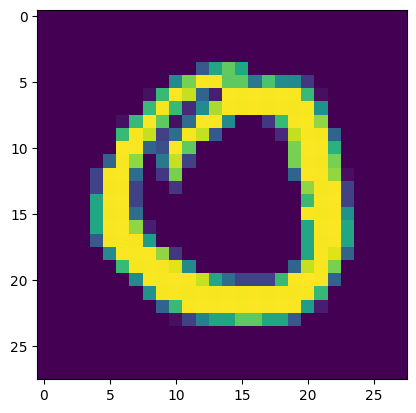

In [39]:
plt.imshow(df.iloc[21012,1:].values.reshape(28,28))

In [40]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

In [41]:
from sklearn.model_selection import train_test_split

In [42]:
X_train , X_test , y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [43]:
X_train.shape

(33600, 784)

In [12]:
from sklearn.neighbors import KNeighborsClassifier

In [13]:
knn =  KNeighborsClassifier()

In [14]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [15]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time())

1670158961.8742852


In [16]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9648809523809524

In [ ]:
##### PCA ############

In [17]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()

In [18]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [19]:
#PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [20]:
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.fit_transform(X_test_scaled)

In [21]:
X_train_pca.shape

(33600, 200)

In [22]:
knn = KNeighborsClassifier()

In [23]:
knn.fit(X_train_pca, y_train)

KNeighborsClassifier()

In [24]:
import time
start = time.time()
y_pred = knn.predict(X_test_pca)
print(time.time())

1670158982.0671039


In [25]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.6692857142857143

In [26]:
########### loop for PCA ##

In [ ]:
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.fit_transform(X_test_scaled)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_pca, y_train)
    
    y_pred = knn.predict(X_test_pca)
        
    print( accuracy_score(y_test, y_pred))

0.2555952380952381
0.3248809523809524
0.5046428571428572
0.6553571428571429
0.7226190476190476
0.8186904761904762
0.835952380952381
0.8639285714285714
0.8764285714285714
0.7601190476190476
0.7722619047619048
0.7777380952380952
0.7833333333333333
0.741904761904762
0.6991666666666667
0.7639285714285714
0.7646428571428572
0.7659523809523809
0.7714285714285715
0.7571428571428571
0.7459523809523809
0.7020238095238095
0.8072619047619047
0.7444047619047619
0.7302380952380952
0.7732142857142857
0.7171428571428572
0.7002380952380952
0.7111904761904762
0.7251190476190477
0.7107142857142857
0.7141666666666666
0.7192857142857143
0.71
0.7179761904761904
0.7066666666666667
0.7139285714285715
0.6910714285714286
0.7083333333333334
0.6933333333333334
0.6945238095238095
0.6957142857142857
0.7010714285714286
0.6857142857142857
0.679404761904762
0.6983333333333334
0.6903571428571429
0.6973809523809524
0.7016666666666667
0.6833333333333333
0.6880952380952381
0.6796428571428571
0.695
0.6922619047619047
0.68

In [30]:

#step=[]
#accuracy
for i in range(1,10):
    pca = PCA(n_components=i)
    X_train_pca = pca.fit_transform(X_train_scaled)
    X_test_pca = pca.fit_transform(X_test_scaled)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_pca, y_train)
    
    y_pred = knn.predict(X_test_pca)
        
d={'step':i, "accuracy": accuracy_score(y_test, y_pred)}
 

In [ ]:
############# vistualization ##########

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()

In [44]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [45]:
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.fit_transform(X_test_scaled)

In [53]:
X_train_pca[:,1]

array([-0.49047786, -6.75299799,  6.50964293, ...,  0.78073625,
        0.94671383,  1.96186614])

In [55]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_pca[:,0],
                y=X_train_pca[:,1],
                color=y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [59]:
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.fit_transform(X_test_scaled)

In [61]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(x=X_train_pca[:,0],
                y=X_train_pca[:,1],
                z=X_train_pca[:,2],
                color=y_train_trf)
fig.update_layout(
    margin = dict(l=20, r=20, t=20, b=20)
            )
fig.show()

In [62]:
### attributes of PCA 

In [63]:
# Eigen values
pca.explained_variance_

array([40.87278367, 28.96628003, 27.04280029])

In [65]:
# Eigen vector
pca.components_.shape

(3, 784)

In [71]:
pca.n_features_

784

In [73]:
## Findout PCA required
# lamdas can explian how each lamdas can explain variance 
# to find percentage = (lamda1/sum of all lamdas)*100

In [ ]:
# lamdas of sum = 90%

In [74]:
pca.explained_variance_ratio_

array([0.06054506, 0.0429079 , 0.04005864])

In [75]:
pca = PCA(n_components=None)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.fit_transform(X_test_scaled)

In [77]:
pca.explained_variance_.shape

(784,)

In [81]:
np.cumsum(pca.explained_variance_ratio_)

array([0.06054506, 0.10345296, 0.1435116 , 0.17415505, 0.2008633 ,
       0.22392381, 0.24424437, 0.26328712, 0.28003017, 0.2950511 ,
       0.30952231, 0.32260084, 0.33454207, 0.34622198, 0.35749028,
       0.36820838, 0.37831441, 0.38840962, 0.39802008, 0.40749915,
       0.41658467, 0.42512074, 0.43338064, 0.44145368, 0.44932118,
       0.45695772, 0.46439035, 0.47152133, 0.47853667, 0.48528122,
       0.49197554, 0.4984955 , 0.50488983, 0.5109932 , 0.5170139 ,
       0.5229398 , 0.52882391, 0.53456336, 0.54018641, 0.54558837,
       0.55086928, 0.55610074, 0.56122164, 0.56626877, 0.57113961,
       0.57591378, 0.58060368, 0.58528499, 0.58988803, 0.59443601,
       0.59890358, 0.60333665, 0.6077026 , 0.61197655, 0.61617648,
       0.6203279 , 0.6243674 , 0.62836904, 0.632244  , 0.63608538,
       0.63988348, 0.64363517, 0.64732886, 0.65099829, 0.65461534,
       0.65818137, 0.66169008, 0.66515602, 0.66856668, 0.67192998,
       0.67525401, 0.67855196, 0.68178585, 0.68499317, 0.68817

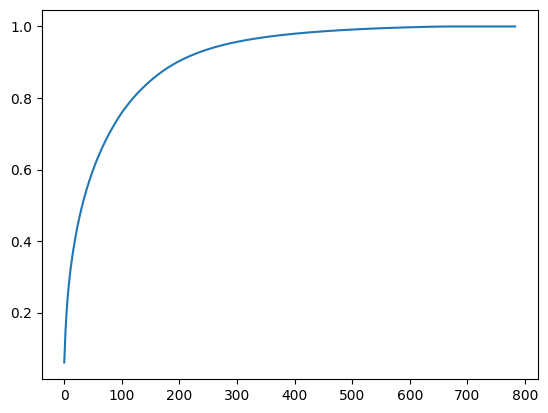

In [83]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

In [ ]:
### PCA does not occur at circularly distributed across axis
# Symmetrical about axis resulting overlappin